In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import scvelo as scv
import numpy as np

In [2]:
data_name = 'zebrafish_dynamo_part'
# data_name = ''
[k_nei, K, L] = [10, 2, 10]
result_path = 'auxiliary_results/'+data_name+' '+str([k_nei,K,L])+'/'
figure_path = result_path
cmap = plt.colormaps['Spectral']

adata0 = sc.read_h5ad('data/'+data_name+'.h5ad')
adata = adata0.copy()

In [3]:
import os

folder = os.path.exists(result_path)
if not folder:                   #判断是否存在文件夹如果不存在则创建为文件夹
    os.makedirs(result_path)            #makedirs 创建文件时如果路径不存在会创建这个路径

In [4]:
adata

AnnData object with n_obs × n_vars = 3386 × 600
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'n_counts', 'ct_score', 'ct_pseudotime', 'ct_num_exp_genes', 'crc'
    var: 'n_cells', 'gene_count_corr', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'ct_gene_corr', 'ct_correlates'
    uns: 'Cell_type_colors', 'ct_params', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

## **Data Visualization** 

In [5]:
# cmap = plt.colormaps['Spectral']
# fig = sc.pl.embedding(
#     adata,
#     color=['crc', "Cell_type"],
#     basis="umap",
#     color_map=cmap,
#     return_fig=True
# )
# fig.savefig(result_path+'output_umap.png')

## **Preprocessing**

In [6]:
from scipy.sparse import csr_matrix

sc.pp.pca(adata, n_comps=50)
sc.pp.neighbors(adata, n_neighbors=k_nei)
scv.pp.moments(adata, n_pcs=50, n_neighbors=k_nei)
scv.tl.velocity(adata)

gene_arr = adata.var.index.values
X_pca = adata.obsm['X_pca']
X_umap = adata.obsm['X_umap']
Xs = adata.layers['Ms'] #adata.X.A#
# Xs = adata.layers['M_s'] #如果是EG_ab_dyn
X = Xs

row = np.array([np.ones((k_nei,))*i for i in range(adata.shape[0])]).flatten()
col = (adata.obsp['distances']+csr_matrix(np.eye(adata.obsp['distances'].shape[0]))).indices
w_val = np.array([np.linalg.norm(X_pca[int(i),:]-X_pca[int(j),:]) for i,j in zip(row,col)])
adj_val = np.ones(col.shape)
A_mat = csr_matrix((adj_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))
W_mat = csr_matrix((w_val, (row, col)), shape=(adata.shape[0], adata.shape[0]))

dc=np.amax(adata.obsp['distances'])
cell_nei=adata.obsp['distances'].indices.reshape([-1,k_nei-1])
nei_w=[]
rho_arr=[]
for i in range(cell_nei.shape[0]):
    dij=np.array([np.linalg.norm(X_pca[i,:]-X_pca[int(j),:]) for j in cell_nei[i]])
    
    rho=np.sum(np.exp(-dij**2/dc**2))
    nei_w.append(np.exp(-dij**2/dc**2)/rho)
    rho_arr.append(rho)
rho_arr=np.array(rho_arr)/np.amax(rho_arr)
nei_w=np.array(nei_w)

computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [7]:
def smooth_func(X_val,cell_nei=cell_nei,nei_w=nei_w):
    X_s=X_val.copy()
    for ci in range(len(X_val)):
        X_s[ci]=np.dot(X_val[cell_nei[ci,:]],nei_w[ci,:])
    return(X_s)

def wasserstein_distance(mu1,sigma1,mu2,sigma2):
    dim=len(mu1)
    dmu=mu1-mu2
    W_dist2=0
    for i in range(dim):
        W_dist2+=dmu[i]**2+sigma1[i]**2+sigma2[i]**2-2*np.sqrt(sigma2[i]*sigma1[i]**2*sigma2[i])
    W_dist=np.sqrt(W_dist2+1e-12)
    return W_dist

In [8]:
X_umap = adata.obsm['X_umap']
X_plt = X_umap[:,0]
Y_plt = X_umap[:,1]
X_min = np.min(X_plt)
X_max = np.max(X_plt)
Y_min = np.min(Y_plt)
Y_max = np.max(Y_plt)
X_len = (X_max-X_min)/5
Y_len = (Y_max-Y_min)/5
wid = min(X_len,Y_len)/30
X_ori = X_min
Y_ori = Y_min

## **CRC**

In [9]:
from utils import *
from g2g_model_Fisher import *

In [10]:
epochs = 400
nsamples = 5
learning_rate = 1e-3
seed = 0
# n_workers = 4

if seed is not None:
    reset_seeds(seed)

A = A_mat
A = A.astype(np.float32)
X = Xs.astype(np.float32)
z = np.zeros(adata.n_obs)

n = A.shape[0]
train_nodes, val_nodes = train_test_split(n, train_ratio=1.0)
A_train = A[train_nodes, :][:, train_nodes]
X_train = X[train_nodes]
z_train = z[train_nodes]
A_val = A[val_nodes, :][:, val_nodes]
X_val = X[val_nodes]
z_val = z[val_nodes]

train_data = AttributedGraph(A_train, X_train, z_train, K)
val_data = AttributedGraph(A_val, X_val, z_val, K)

encoder = Encoder(X.shape[1], L)

In [11]:
optimizer = optim.Adam(encoder.parameters(), lr=learning_rate)

iterations = epochs #// n_workers
dataset = GraphDataset(train_data, nsamples, iterations)
loader = DataLoader(
    dataset,
    batch_size=1,
#     num_workers=n_workers,
    worker_init_fn=reset_seeds,
    collate_fn=lambda args: args,
)

In [12]:
for batch_idx, data in enumerate(loader):
    encoder.train()
    optimizer.zero_grad()

    # compute weighted loss
    _ ,i,j,k,w,nsamples = data[0][0],data[0][1],data[0][2],data[0][3],data[0][4],data[0][5]

    mu, sigma = encoder.forward(data[0][0])

    mu_i = gather_rows(mu, i)
    sigma_i = gather_rows(sigma, i)
    mu_j = gather_rows(mu, j)
    sigma_j = gather_rows(sigma, j)
    mu_k = gather_rows(mu, k)
    sigma_k = gather_rows(sigma, k)

    diff_ij = mu_i - mu_j
    ss_ij = sigma_i + sigma_j
    ds_ij = sigma_i - sigma_j
    
    closer = 2*((torch.log (
        
        (torch.sqrt(0.5*diff_ij**2+ss_ij**2+1e-10)+torch.sqrt(0.5*diff_ij**2+ds_ij**2+1e-10)+1e-10)/\
        torch.abs((torch.sqrt(0.5*diff_ij**2+ss_ij**2+1e-10)-torch.sqrt(0.5*diff_ij**2+ds_ij**2+1e-10)+1e-10)
        +1e-10)
            ))**2).sum(axis=-1)

    diff_ik = mu_i - mu_k
    ss_ik = sigma_i + sigma_k
    ds_ik = sigma_i - sigma_k
    
    apart = 2*((torch.log (
        
        (torch.sqrt(0.5*diff_ik**2+ss_ik**2+1e-10)+torch.sqrt(0.5*diff_ik**2+ds_ik**2+1e-10)+1e-10)/\
        torch.abs((torch.sqrt(0.5*diff_ik**2+ss_ik**2+1e-10)-torch.sqrt(0.5*diff_ik**2+ds_ik**2+1e-10)+1e-10)
        +1e-10)
            ))**2).sum(axis=-1)

    # E = closer*weight[i,j] + torch.exp(-torch.sqrt(apart))*weight[i,k] 
    E = closer + torch.exp(-torch.sqrt(apart)) 

    loss = E.dot(w) / nsamples
    if batch_idx% 10 == 0:
        print(batch_idx,loss)
    loss.backward()
    optimizer.step()

torch.save(encoder,result_path+'encoder.pt')

0 tensor(1.2856e+11, grad_fn=<DivBackward0>)
10 tensor(1.3436e+09, grad_fn=<DivBackward0>)
20 tensor(7.2121e+08, grad_fn=<DivBackward0>)
30 tensor(6.5285e+08, grad_fn=<DivBackward0>)
40 tensor(5.7597e+08, grad_fn=<DivBackward0>)
50 tensor(5.3478e+08, grad_fn=<DivBackward0>)
60 tensor(4.8352e+08, grad_fn=<DivBackward0>)
70 tensor(4.5555e+08, grad_fn=<DivBackward0>)
80 tensor(4.2349e+08, grad_fn=<DivBackward0>)
90 tensor(4.0018e+08, grad_fn=<DivBackward0>)
100 tensor(3.7433e+08, grad_fn=<DivBackward0>)
110 tensor(3.5387e+08, grad_fn=<DivBackward0>)
120 tensor(3.4251e+08, grad_fn=<DivBackward0>)
130 tensor(3.3435e+08, grad_fn=<DivBackward0>)
140 tensor(3.1810e+08, grad_fn=<DivBackward0>)
150 tensor(3.1244e+08, grad_fn=<DivBackward0>)
160 tensor(3.0470e+08, grad_fn=<DivBackward0>)
170 tensor(2.9634e+08, grad_fn=<DivBackward0>)
180 tensor(2.9235e+08, grad_fn=<DivBackward0>)
190 tensor(2.8429e+08, grad_fn=<DivBackward0>)
200 tensor(2.8209e+08, grad_fn=<DivBackward0>)
210 tensor(2.7942e+08, g

In [13]:
encoder = torch.load(result_path+'encoder.pt')

mu, sigma = encoder(torch.tensor(X))
mu_learned = mu.detach().numpy()
sigma_learned = sigma.detach().numpy()

Fisher_g=np.zeros((X.shape[0],L*2,L*2))
for i in range(X.shape[0]):
    for j in range(L):
        Fisher_g[i,j,j]=1/sigma_learned[i,j]**2
        Fisher_g[i,L+j,L+j]=2/sigma_learned[i,j]**2

Fisher_g_diag = np.zeros([X.shape[0],L*2])
for i in range(X.shape[0]):
    Fisher_g_diag[i] = np.diag(Fisher_g[i])

In [14]:
cRc_arr=[]
cRc_arr_eu=[]
A = csr_matrix(A + np.eye(A.shape[0]))
for inds in np.split(A.indices, A.indptr)[1:-1]:
    self_ind=inds[0]
    cRc=0
    cRc_eu=0
    for nei_k in range(1,len(inds)):

        dEu=np.linalg.norm(X[self_ind,:]-X[inds[nei_k],:])
        dFi=Fisher_dist(mu_learned[self_ind,:],sigma_learned[self_ind,:],\
                        mu_learned[inds[nei_k],:],sigma_learned[inds[nei_k],:])
        dWa=wasserstein_distance(mu_learned[self_ind,:],sigma_learned[self_ind,:],\
                        mu_learned[inds[nei_k],:],sigma_learned[inds[nei_k],:])

        cRc+=1-dWa/dFi
        cRc_eu+=1-dWa/dEu

    cRc_arr.append(cRc/len(inds))
    cRc_arr_eu.append(cRc_eu/len(inds))
crc = np.array(cRc_arr)
crc_eu = np.array(cRc_arr_eu)
crc_smooth = smooth_func(crc_eu)

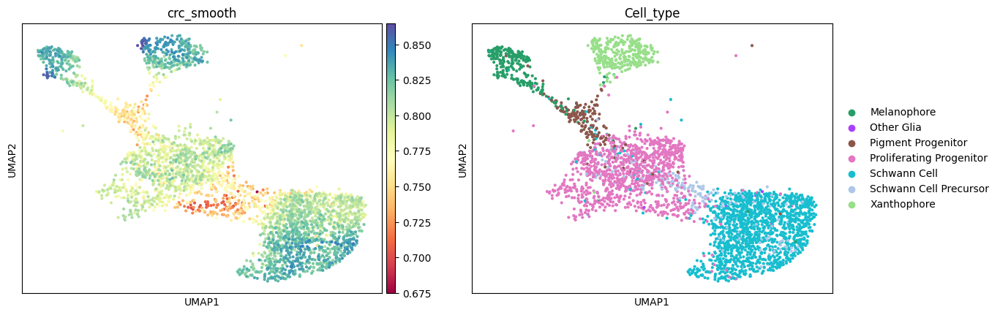

In [15]:
if data_name == 'zebrafish_dynamo_part':    
    adata.obs['crc_smooth'] = crc_smooth
    fig = sc.pl.embedding(
        adata,
        color=['crc_smooth', "Cell_type"],
        basis="umap",
        color_map=cmap,
        return_fig=True
    )
    fig.savefig(result_path+'sc_crc_umap.png')

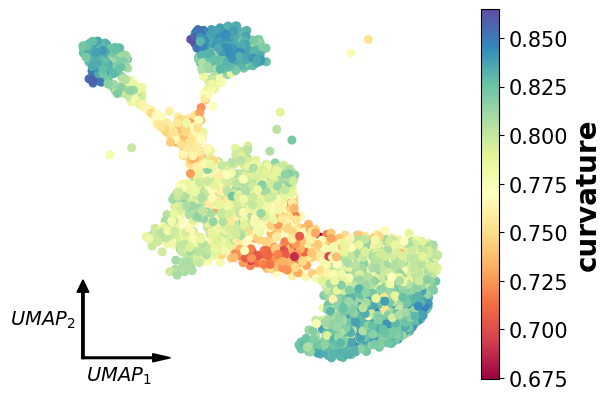

In [16]:
idx = ~np.isnan(crc_smooth)
cmap = plt.colormaps['Spectral']
plt.scatter(X_plt[idx],Y_plt[idx],c=crc_smooth[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('curvature',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'crc_smooth')
plt.show()


In [17]:
np.save(result_path+'/crc_smooth', crc_smooth)

In [18]:
adata

AnnData object with n_obs × n_vars = 3386 × 600
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch', 'n_counts', 'ct_score', 'ct_pseudotime', 'ct_num_exp_genes', 'crc', 'crc_smooth'
    var: 'n_cells', 'gene_count_corr', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'ct_gene_corr', 'ct_correlates', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'Cell_type_colors', 'ct_params', 'hvg', 'log1p', 'neighbors', 'pca', 'umap', 'velocity_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'spliced', 'unspliced', 'velocity', 'variance_velocity'
    obsp: 'connectivities', 'distances'

## 

## **IV**

**velo_pca**

In [19]:
velo0 = np.array(adata.layers['velocity'])
velo_g = np.zeros(velo0.shape)
velo_g[:,adata.var['velocity_genes']] = velo0[:,adata.var['velocity_genes']]
velo_pca = velo_g@adata.varm['PCs']

In [20]:
#------use a simple neural network to study dmu/dt and dsigma/dt
latent_z = np.hstack((mu_learned,sigma_learned))
pca_dim = 50


model = nn.Sequential(
    nn.Linear(pca_dim, 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,2*L),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(encoder.parameters(), lr=learning_rate)

x_in=torch.tensor(X_pca.astype(np.float32))
x_out=torch.tensor(latent_z.astype(np.float32))
# Train the model
for epoch in range(200):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
#     if epoch% 10 == 9:
#         print(epoch,loss)
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

pZ_pX = np.zeros([X.shape[0], L*2, X_pca.shape[1]])

# Compute the gradients
for i in range(X.shape[0]):
    x0=torch.tensor(X_pca[i,:],requires_grad=True)
    z=model(x0)
    for j in range(2*L):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pZ_pX[i,j,:] = x0.grad.detach()

Z_velo = np.array([pZ_pX[i]@velo_pca[i] for i in range(X.shape[0])])

zv2 = np.zeros(X.shape[0])
for i in range(X.shape[0]):
    for j in range(L):
        # zv2[i] += Fisher_g[i,2*j,2*j]*Z_velo[i,2*j]**2 + Fisher_g[i,2*j+1,2*j+1]*Z_velo[i,2*j+1]**2
        zv2[i] += Fisher_g[i,j,j]*Z_velo[i,j]**2 + Fisher_g[i,L+j,L+j]*Z_velo[i,L+j]**2
zv1 = np.sqrt(zv2)
zv1_smooth = smooth_func(zv1)

In [21]:
adata.obs['IV_pca'] = zv1_smooth

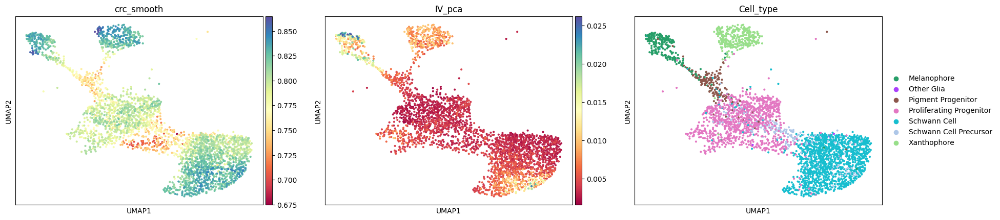

In [22]:
if data_name == 'zebrafish_dynamo_part':
    adata.obs['crc_smooth'] = crc_smooth
    fig = sc.pl.embedding(
        adata,
        color=['crc_smooth', 'IV_pca', "Cell_type"],
        basis="umap",
        color_map=cmap,
        return_fig=True
    )

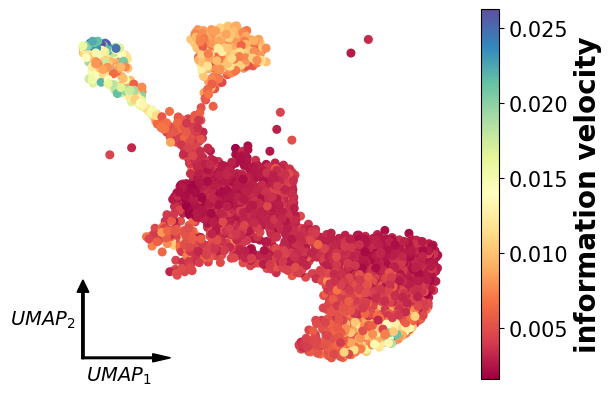

In [23]:
idx = ~np.isnan(zv1_smooth)
cmap = plt.colormaps['Spectral']
plt.scatter(X_plt[idx],Y_plt[idx],c=zv1_smooth[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('information velocity',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'iv_smooth')
plt.show()

In [24]:
np.save(result_path+'/iv_smooth', zv1_smooth)

## **Fisher**

In [25]:
eigs = np.zeros((X.shape[0],2*L))
eigvecs = np.zeros((X.shape[0],2*L, 2*L))
for i in range(X.shape[0]):
    eig, eigvec = np.linalg.eig(Fisher_g[i])
    sorted_indices = np.argsort(eig)[::-1]  # 从大到小排序
    eigs[i] = eig[sorted_indices]
    eigvecs[i] = eigvec[sorted_indices]

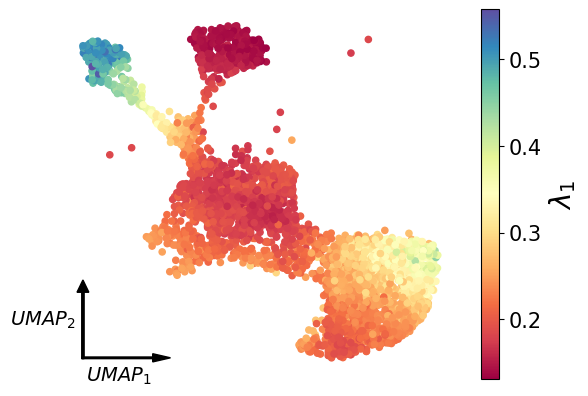

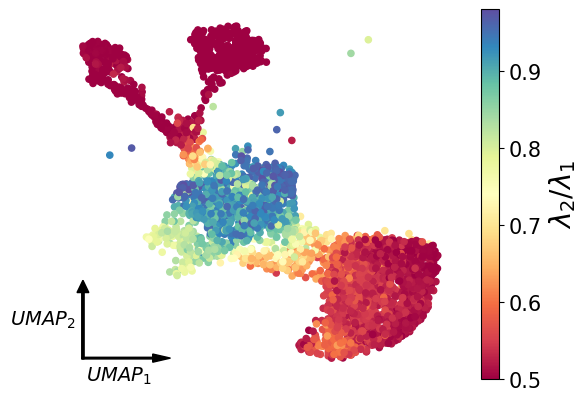

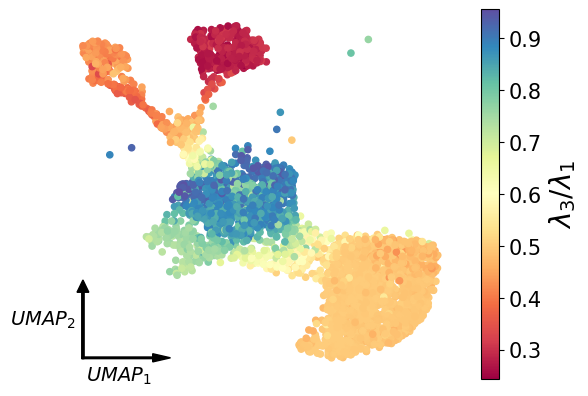

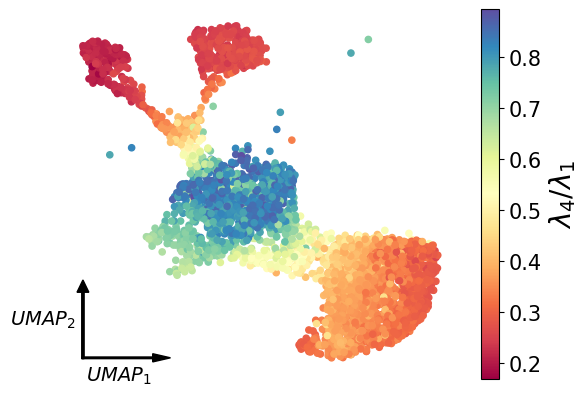

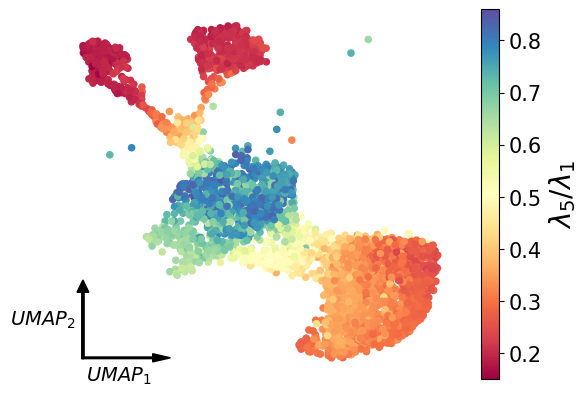

...

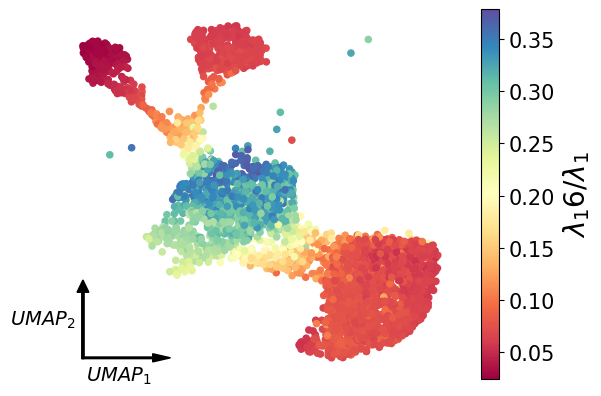

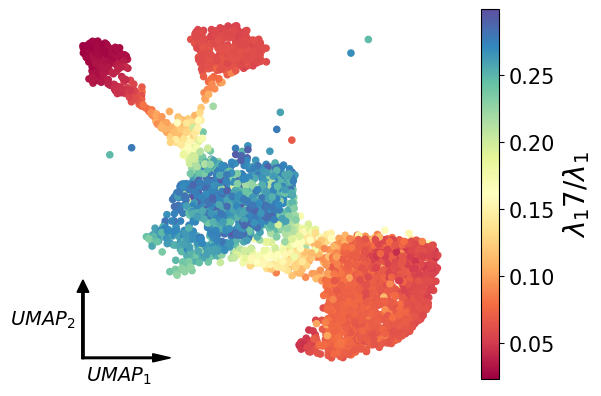

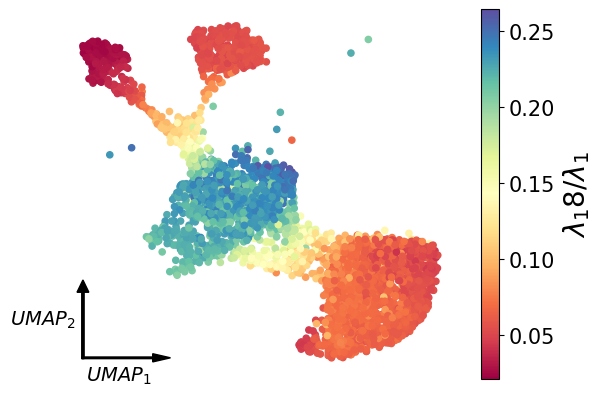

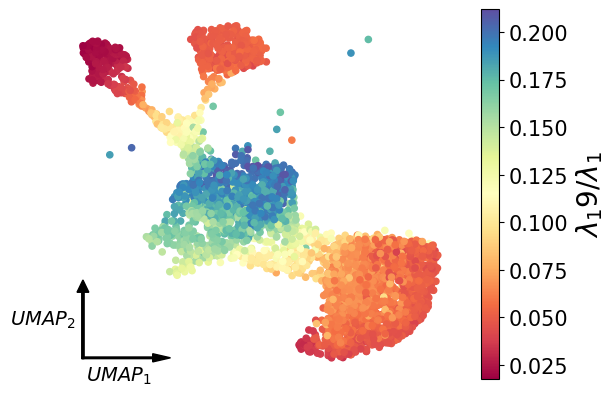

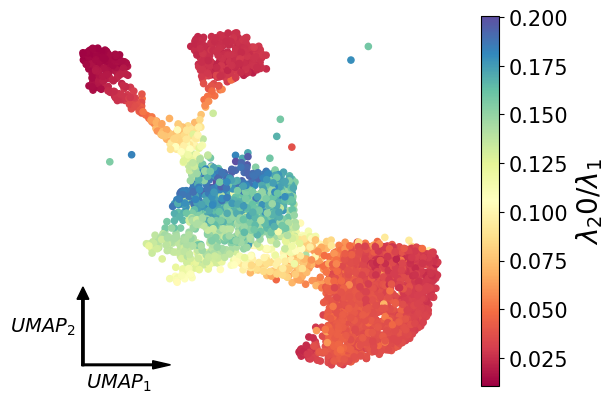

In [26]:
cmap = plt.colormaps['Spectral']
plt.scatter(adata.obsm['X_umap'][:,0], adata.obsm['X_umap'][:,1], c=smooth_func(eigs[:,0]), cmap=cmap, s=20)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel(f'$\lambda_{1}$',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+f'eig_latent_{1}')
plt.show()

for k in range(1,2*L):
    cmap = plt.colormaps['Spectral']
    plt.scatter(adata.obsm['X_umap'][:,0], adata.obsm['X_umap'][:,1], c=smooth_func(eigs[:,k]/eigs[:,0]), cmap=cmap, s=20)
    plt.axis('off')

    clb=plt.colorbar()
    clb.ax.set_ylabel(f'$\lambda_{k+1}/\lambda_{1}$',fontsize=20,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)

    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
    plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
    plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

    plt.savefig(result_path+f'eig_ratio_latent_{k+1}')
    plt.show()

In [27]:
np.save(result_path+'/fisher_latent', Fisher_g)
np.save(result_path+'/eig_latent', eigs)
np.save(result_path+'/eigvec_latent', eigvecs)

## **Fisher pca**

In [28]:
Fisher_pca = np.zeros((X.shape[0],pca_dim, pca_dim))
for i in range(X.shape[0]):
    Fisher_pca[i] = pZ_pX[i].T@Fisher_g[i]@pZ_pX[i]

In [29]:
eigs_pca = np.zeros((X.shape[0],pca_dim))
eigvecs_pca = np.zeros((X.shape[0],pca_dim, pca_dim))
for i in range(X.shape[0]):
    eig, eigvec = np.linalg.eig(Fisher_pca[i])
    sorted_indices = np.argsort(eig)[::-1]  # 从大到小排序
    eigs_pca[i] = eig[sorted_indices]
    eigvecs_pca[i] = eigvec[sorted_indices]

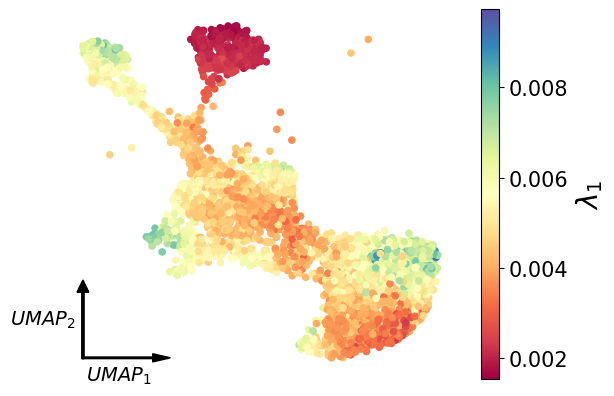

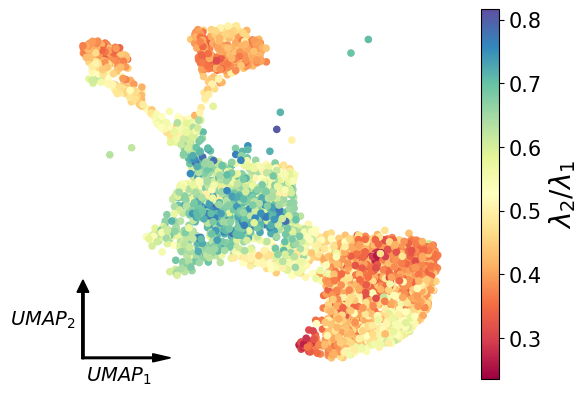

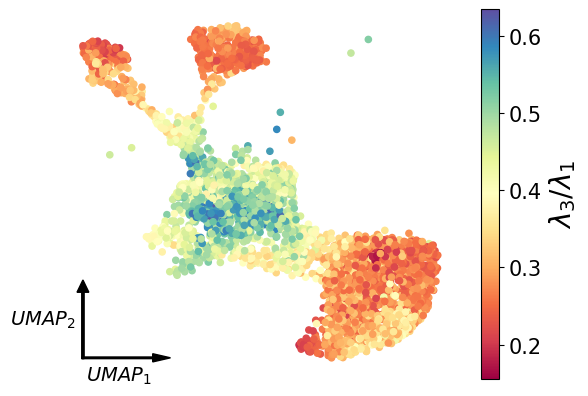

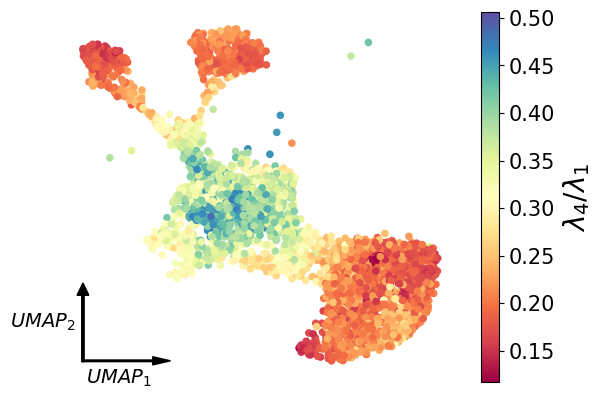

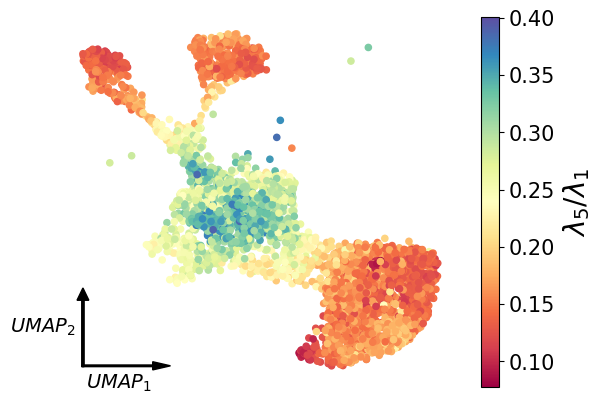

...

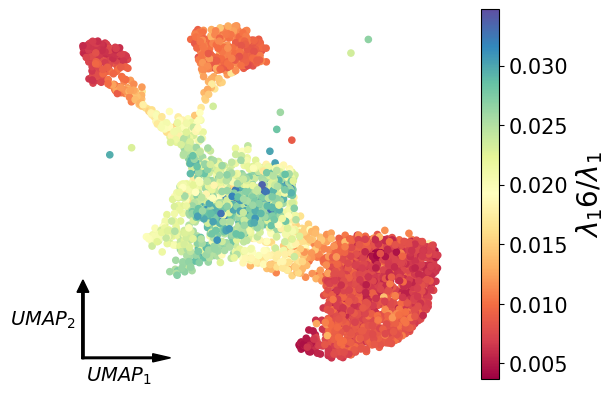

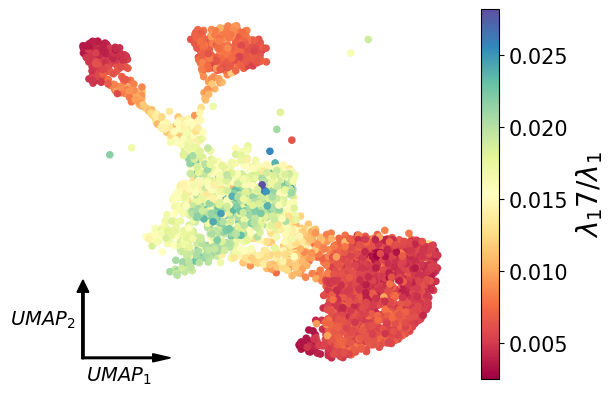

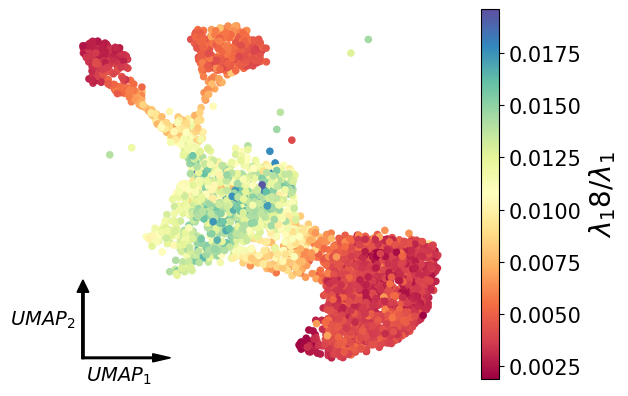

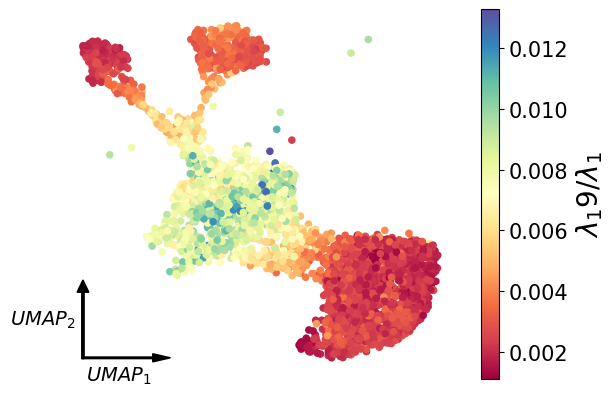

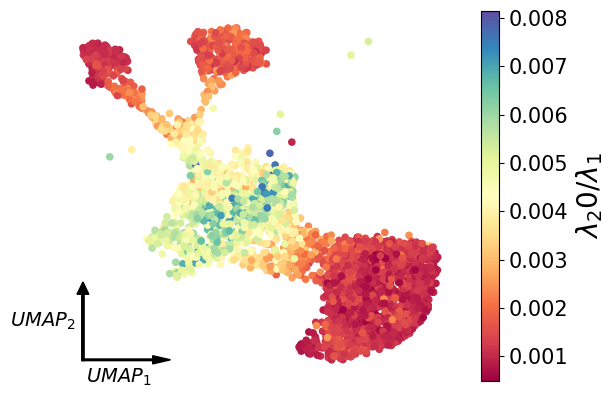

In [30]:
cmap = plt.colormaps['Spectral']
plt.scatter(adata.obsm['X_umap'][:,0], adata.obsm['X_umap'][:,1], c=smooth_func(eigs_pca[:,0]), cmap=cmap, s=20)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel(f'$\lambda_{1}$',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+f'eig_pca_{1}')
plt.show()

for k in range(1,20):
    cmap = plt.colormaps['Spectral']
    plt.scatter(adata.obsm['X_umap'][:,0], adata.obsm['X_umap'][:,1], c=smooth_func(eigs_pca[:,k]/eigs_pca[:,0]), cmap=cmap, s=20)
    plt.axis('off')

    clb=plt.colorbar()
    clb.ax.set_ylabel(f'$\lambda_{k+1}/\lambda_{1}$',fontsize=20,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)

    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
    plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
    plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

    plt.savefig(result_path+f'eig_ratio_pca_{k+1}')
    plt.show()

In [31]:
np.save(result_path+'/fisher_pca', Fisher_pca)
np.save(result_path+'/eig_pca', eigs_pca)
np.save(result_path+'/eigvec_pca', eigvecs_pca)

## **Eigen gene**

In [32]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy.cluster.hierarchy import fcluster,leaders
from sklearn.decomposition import PCA
from scipy.linalg import inv
from scipy.cluster.hierarchy import dendrogram, linkage

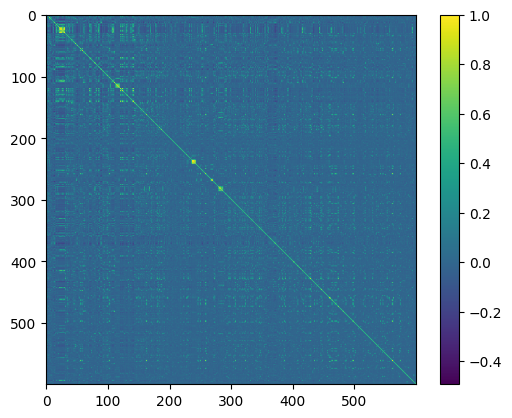

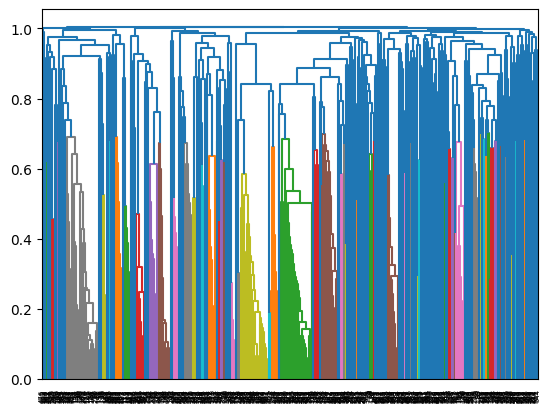

In [33]:
scaler=StandardScaler()
X=scaler.fit_transform(Xs)

X_corr=np.corrcoef(X, rowvar=False)
plt.imshow(X_corr)
plt.colorbar()
plt.show()

Z=linkage((1-X_corr)[np.triu_indices(X_corr.shape[0],k=1)],method='weighted')#method='weighted')
dg=dendrogram(Z)
X_re= X[:,dg['leaves']]#X_re reorder X by clustering

X_corr_re=np.corrcoef(X_re, rowvar=False)
plt.show()

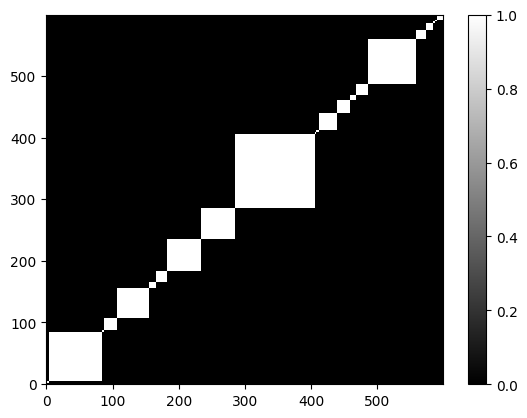

In [34]:
td = 0.98
T = fcluster(Z, t=td, criterion='distance')
# T=fcluster(Z, t=td, criterion='maxclust')
T_re = T[dg['leaves']]

X_corr_label = np.zeros(X_corr_re.shape)
for i in range(X_corr_re.shape[0]):
    label_ind = np.where(T_re==T_re[i])[0]
    X_corr_label[i,label_ind] = 1

plt.imshow(X_corr_label, aspect='auto', cmap=plt.cm.gray, interpolation='nearest',origin='lower')
plt.colorbar()
plt.show()

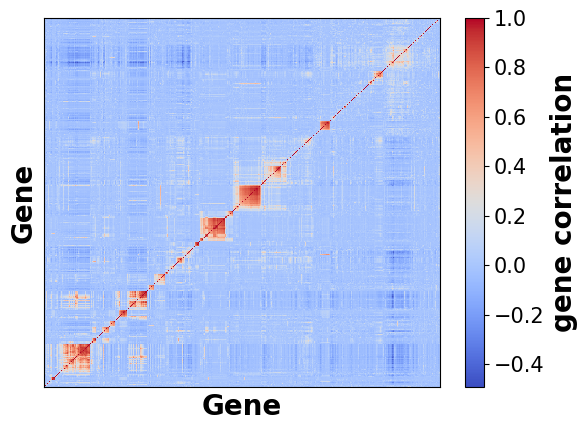

In [35]:
# plt.figure(figsize=(9,6))
plt.imshow(X_corr_re, aspect='auto', cmap=plt.cm.coolwarm, interpolation='nearest',origin='lower')
# plt.imshow(X_corr_re, aspect='auto', cmap=plt.cm.gray, interpolation='nearest',origin='lower')

plt.xlabel('Gene',fontsize=20,fontweight='bold')
plt.ylabel('Gene',fontsize=20,fontweight='bold')
plt.xticks([])
plt.yticks([])
# plt.xticks(fontsize=15)#,fontweight='bold')
# plt.yticks(fontsize=15)#,fontweight='bold')

clb = plt.colorbar()
clb.ax.set_ylabel('gene correlation',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)

# alphas = X_corr_label.copy()
# alphas[X_corr_label==1] = 0
# alphas[X_corr_label==0] = 0.5
# plt.imshow(X_corr_label, aspect='auto', cmap=plt.cm.gray, interpolation='nearest',origin='lower',alpha=alphas)

# plt.savefig(result_path+'3f.png',dpi=600,bbox_inches='tight')
plt.show()

In [36]:
# eigen gene is the value of first principal component of each community
def eigen_gene(X_re,T_re):#return the weights of each gene in correponding eigen gene
    eigen_X_w=[]
    for i in np.unique(T_re):
        if i == -1:
            continue
        if (X_re[:,T_re==i]).shape[1] <= 1:
            continue

        pca=PCA(n_components=2).fit(X_re[:,T_re==i])
        print(pca.explained_variance_ratio_)
        eigen_X_w.append(pca.components_[0,:])
#         eigen_gene_size.append(np.where(T_re==i)[0].shape[0])
    return eigen_X_w

In [37]:
eigen_X_w = eigen_gene(X_re,T_re)
eigen_dim=len(eigen_X_w)
print(eigen_dim)

[0.66462487 0.33537522]
[0.42058435 0.31476137]
[0.33716407 0.06532998]
[0.41812614 0.3190138 ]
[0.34477156 0.2687945 ]
[0.3722376  0.18652241]
[0.54420453 0.10436326]
[0.42547202 0.06731554]
[0.14889711 0.12506756]
[0.49114263 0.12619853]
[0.22657494 0.11680169]
[0.57209605 0.42790398]
[0.30220804 0.25881723]
[0.3953483  0.09496942]
[0.1308313  0.09944473]
[0.19097754 0.1531446 ]
[0.1166646  0.08908065]
[0.16306429 0.10435238]
[0.16844115 0.13155122]
[0.14842589 0.12179779]
[0.37331817 0.32279852]
[0.41844547 0.3363116 ]
[0.20548595 0.14603375]
23


In [38]:
cell_eigen_X=np.zeros((X_re.shape[0],eigen_dim))
for j in range(X_re.shape[0]):
    for k in range(len(eigen_X_w)):
        cell_eigen_X[j,k]=np.dot(eigen_X_w[k],X_re[j,T_re==k+1])

In [39]:
model = nn.Sequential(
    nn.Linear(cell_eigen_X.shape[1], 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,2*L),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

x_in=torch.tensor(cell_eigen_X.astype(np.float32))
x_out=torch.tensor(latent_z.astype(np.float32))
# Train the model
for epoch in range(500):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Print loss for each epoch
#         print(f'Epoch {epoch+1}, Loss: {loss.item()}')

# Initialize a tensor to store the gradients
pZ_pEg = np.zeros([cell_eigen_X.shape[0], L*2, cell_eigen_X.shape[1]])

# Compute the gradients
for i in range(cell_eigen_X.shape[0]):
    x0=torch.tensor(cell_eigen_X[i,:].astype(np.float32),requires_grad=True)
    z=model(x0)
    for j in range(2*L):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pZ_pEg[i,j,:] = x0.grad.detach()
print(pZ_pEg.shape)

(3386, 20, 23)


In [40]:
Fisher_eg = np.zeros((X.shape[0],eigen_dim, eigen_dim))
for i in range(X.shape[0]):
    Fisher_eg[i] = pZ_pEg[i].T@Fisher_g[i]@pZ_pEg[i]

In [41]:
eigs_eg = np.zeros((X.shape[0],eigen_dim))
eigvecs_eg = np.zeros((X.shape[0],eigen_dim, eigen_dim))
for i in range(X.shape[0]):
    eig, eigvec = np.linalg.eig(Fisher_eg[i])
    sorted_indices = np.argsort(eig)[::-1]  # 从大到小排序
    eigs_eg[i] = eig[sorted_indices]
    eigvecs_eg[i] = eigvec[sorted_indices]

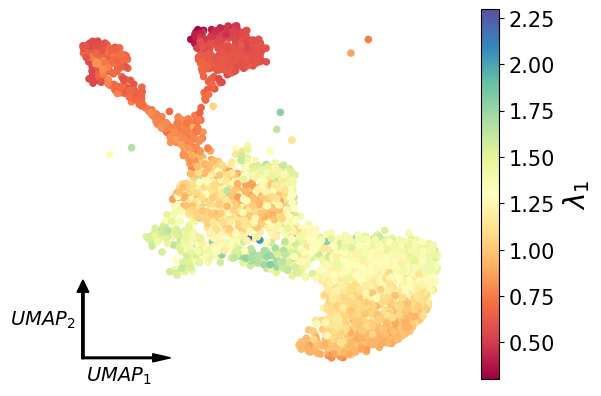

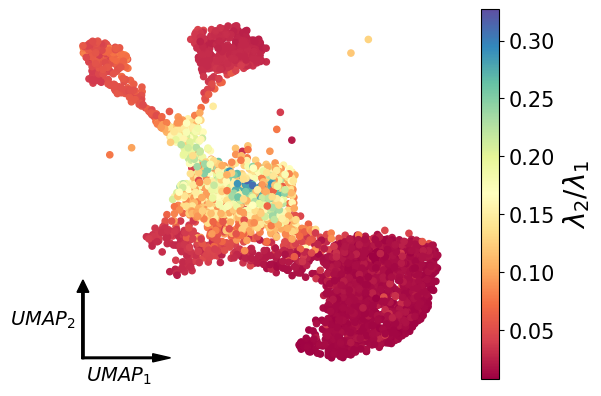

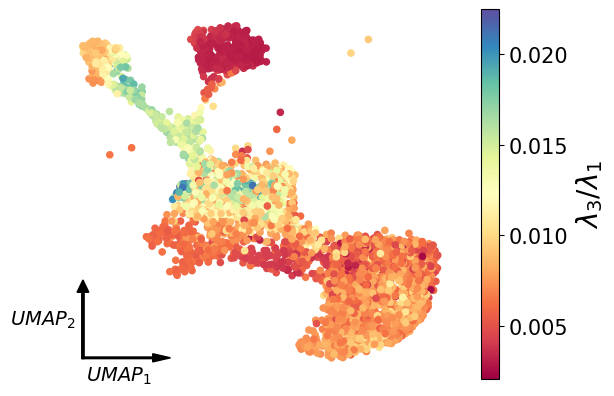

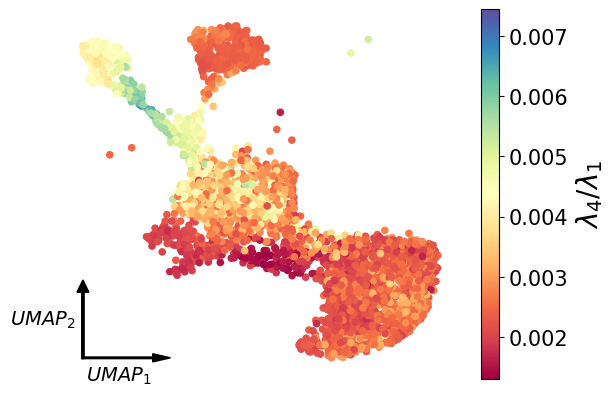

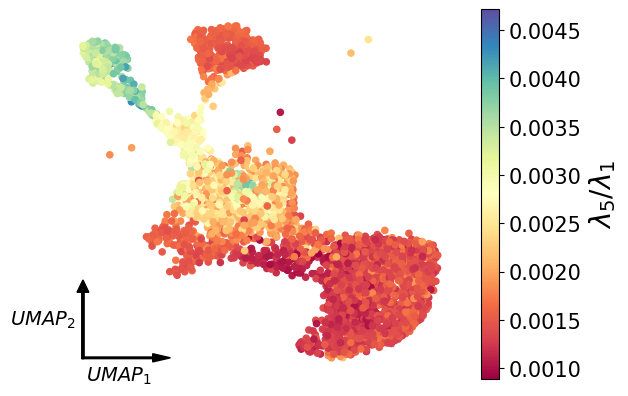

...

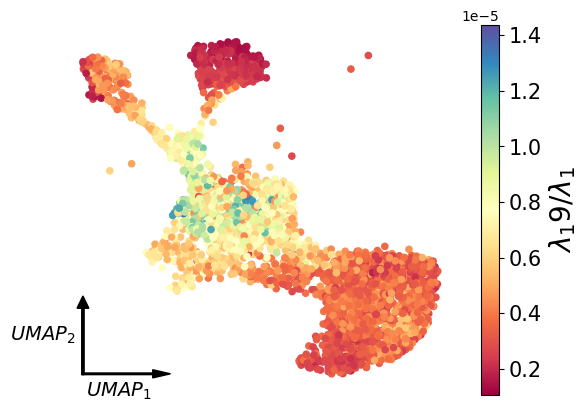

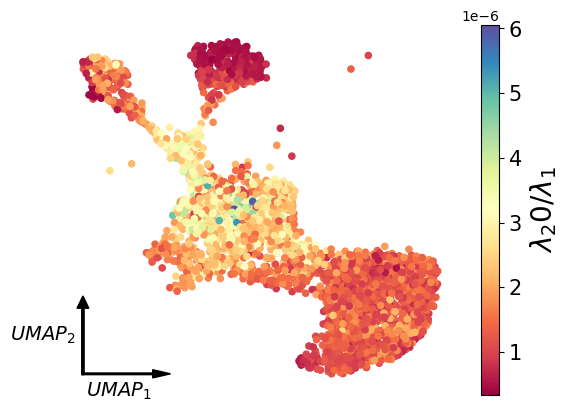

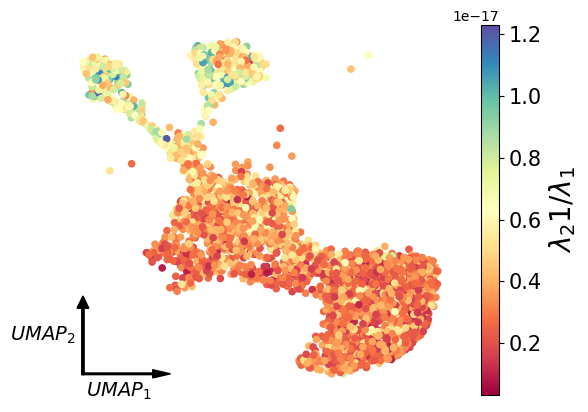

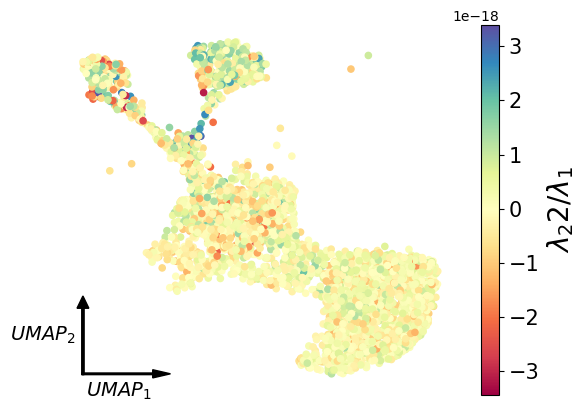

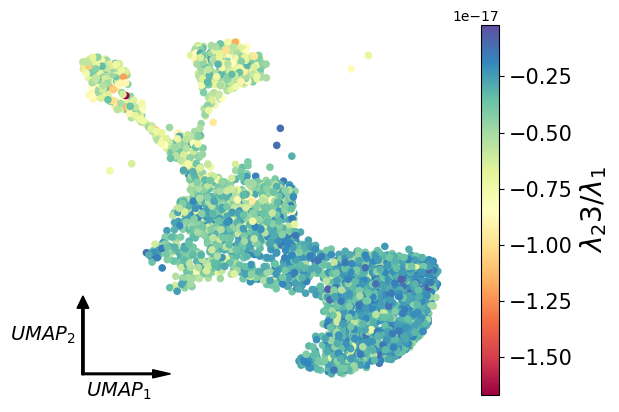

In [42]:
cmap = plt.colormaps['Spectral']
plt.scatter(adata.obsm['X_umap'][:,0], adata.obsm['X_umap'][:,1], c=smooth_func(eigs_eg[:,0]), cmap=cmap, s=20)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel(f'$\lambda_{1}$',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+f'eig_eigen_{1}')
plt.show()

for k in range(1,eigen_dim):
    cmap = plt.colormaps['Spectral']
    plt.scatter(adata.obsm['X_umap'][:,0], adata.obsm['X_umap'][:,1], c=smooth_func(eigs_eg[:,k]/eigs_eg[:,0]), cmap=cmap, s=20)
    plt.axis('off')

    clb=plt.colorbar()
    clb.ax.set_ylabel(f'$\lambda_{k+1}/\lambda_{1}$',fontsize=20,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)

    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
    plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
    plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

    plt.savefig(result_path+f'eig_ratio_eigen_{k+1}')
    plt.show()

In [43]:
np.save(result_path+'/fisher_eigen', Fisher_eg)
np.save(result_path+'/eig_eigen', eigs_eg)
np.save(result_path+'/eigvec_eigen', eigvecs_eg)

## **Fisher hotspot**

In [44]:
import hotspot

In [45]:
# Create the Hotspot object and the neighborhood graph
# hotspot works a lot faster with a csc matrix!
hs = hotspot.Hotspot(
    adata, 
    model='danb',
    distances_obsp_key = 'distances'
)

hs.create_knn_graph(
    weighted_graph=False, n_neighbors=30,
)

In [46]:
hs_results = hs.compute_autocorrelations(jobs=1)

hs_results.head(15)

100%|██████████| 600/600 [00:00<00:00, 1148.36it/s]


,C,Z,Pval,FDR
Gene,,,,
zgc:165461,0.786274,176.100617,0.0,0.0
cldnk,0.897316,151.498600,0.0,0.0
rrm2,0.796289,144.600980,0.0,0.0
pmp22b,0.881675,143.633679,0.0,0.0
mdka,0.750876,136.587338,0.0,0.0
mmp17b,0.783599,135.116454,0.0,0.0
cd59,0.872905,133.944152,0.0,0.0
socs3a,0.817245,123.250102,0.0,0.0
ptmaa,0.832601,115.093874,0.0,0.0


In [47]:
# Select the genes with significant lineage autocorrelation
hs_genes = hs_results.loc[hs_results.FDR < 0.1].sort_values('Z', ascending=False).head(800).index

# Compute pair-wise local correlations between these genes
lcz = hs.compute_local_correlations(hs_genes, jobs=1)

Computing pair-wise local correlation on 302 features...


100%|██████████| 45451/45451 [00:02<00:00, 21877.27it/s]


**Tuning parameter: min_gene_threshold**

In [48]:
modules = hs.create_modules(
    min_gene_threshold=10, core_only=True, fdr_threshold=0.05
)

modules.value_counts()
# np.save(result_path+'modules', modules.values)
# np.save(result_path+'hs_genes', hs_genes)

Module
-1     55
 3     44
 5     39
 1     37
 2     35
 7     18
 6     16
 9     15
 8     12
 4     11
 10    10
 11    10
Name: count, dtype: int64

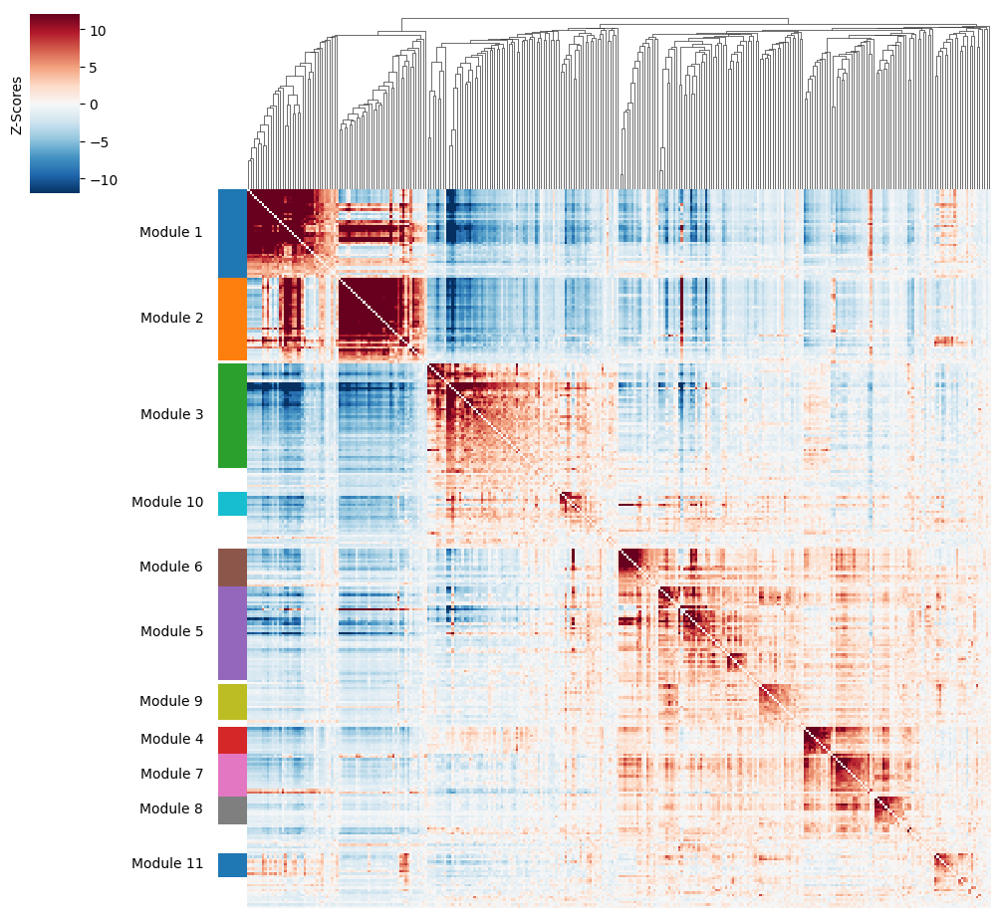

In [49]:
hs.plot_local_correlations(vmin=-12, vmax=12)

In [50]:
module_scores = hs.calculate_module_scores()

module_scores.head()

Computing scores for 11 modules...


100%|██████████| 11/11 [00:00<00:00, 30.97it/s]


,1,2,3,4,5,6,7,8,9,10,11
index,,,,,,,,,,,
TGCCAAATCACCACCT-1-0,0.177545,-0.477216,-1.548769,0.553630,0.185385,0.035664,1.653435,0.030106,0.149613,-0.493937,1.171043
CAGCGACAGAGAACAG-1-0,-0.888074,-0.742824,-1.909756,0.138885,1.323815,0.038744,0.085738,-0.051520,1.979370,-0.644530,-0.122895
TCCCGATAGTGTGGCA-1-0,-0.843754,-0.641192,-0.625356,-0.000980,0.165505,-0.096080,-0.256353,-0.294064,-0.294477,1.499744,0.026060
CAGAGAGAGGCGATAC-1-0,-0.753323,-0.367316,-1.574841,1.262519,-0.143964,0.463118,2.484085,0.340385,-0.009897,-0.470186,1.271959
ATTGGACGTCTAGCGC-1-0,-0.623427,-0.497464,-1.588914,0.113721,0.388880,-0.067082,0.521756,0.350236,0.755158,0.806302,2.036886


In [51]:
module_cols = []
for c in module_scores.columns:
    key = f"Module {c}"
    adata.obs[key] = module_scores[c]
    module_cols.append(key)

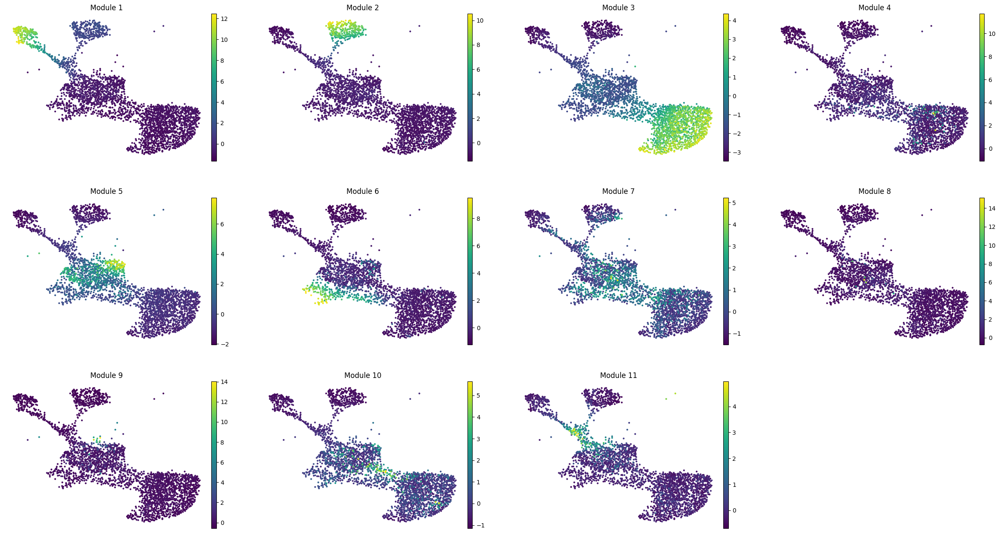

In [52]:
fig = sc.pl.umap(adata, color=module_cols, frameon=False, return_fig=True)

In [53]:
adata_hs = adata[:,hs_genes] # 只用hotspot有效的gene
T_hs = np.array(hs.modules.tolist()) # 记录所有hs gene的module
adata_hs.var_names

Index(['zgc:165461', 'cldnk', 'rrm2', 'pmp22b', 'mdka', 'mmp17b', 'cd59',
       'socs3a', 'ptmaa', 'plp1b',
       ...
       'brinp3a.1', 'wnt4b', 'akap11', 'CU104698.1', 'rhpn2', 'mfsd13a',
       'rpp30', 'pbxip1b', 'cyp26b1', 'tubb2'],
      dtype='object', length=302)

In [54]:
scaler = StandardScaler()
X_hs = scaler.fit_transform(adata_hs.layers['Ms'])
hs_X_w = eigen_gene(X_hs,T_hs)
hs_dim=len(hs_X_w)
print(hs_dim)

[0.51506525 0.10410262]
[0.62205374 0.07454817]
[0.24875912 0.08485006]
[0.66393054 0.08162098]
[0.1724403  0.08481777]
[0.42787609 0.0900711 ]
[0.2806301  0.14544198]
[0.7325393  0.09394836]
[0.43341455 0.12281118]
[0.30677608 0.14463648]
[0.23916803 0.11689163]
11


In [55]:
cell_hs_X=np.zeros((X_hs.shape[0],hs_dim))
for j in range(X_hs.shape[0]):
    for k in range(len(hs_X_w)):
        cell_hs_X[j,k]=np.dot(hs_X_w[k],X_hs[j,T_hs==k+1])

In [56]:
model = nn.Sequential(
    nn.Linear(cell_hs_X.shape[1], 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,2*L),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

x_in=torch.tensor(cell_hs_X.astype(np.float32))
x_out=torch.tensor(latent_z.astype(np.float32))
# Train the model
for epoch in range(500):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Print loss for each epoch
#         print(f'Epoch {epoch+1}, Loss: {loss.item()}')

# Initialize a tensor to store the gradients
pZ_phs = np.zeros([cell_hs_X.shape[0], L*2, cell_hs_X.shape[1]])

# Compute the gradients
for i in range(cell_hs_X.shape[0]):
    x0=torch.tensor(cell_hs_X[i,:].astype(np.float32),requires_grad=True)
    z=model(x0)
    for j in range(2*L):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pZ_phs[i,j,:] = x0.grad.detach()
print(pZ_phs.shape)

(3386, 20, 11)


In [57]:
Fisher_hs = np.zeros((X.shape[0],hs_dim, hs_dim))
for i in range(X.shape[0]):
    Fisher_hs[i] = pZ_phs[i].T@Fisher_g[i]@pZ_phs[i]

In [58]:
eigs_hs = np.zeros((X.shape[0],hs_dim))
eigvecs_hs = np.zeros((X.shape[0],hs_dim, hs_dim))
for i in range(X.shape[0]):
    eig, eigvec = np.linalg.eig(Fisher_hs[i])
    sorted_indices = np.argsort(eig)[::-1]  # 从大到小排序
    eigs_hs[i] = eig[sorted_indices]
    eigvecs_hs[i] = eigvec[sorted_indices]

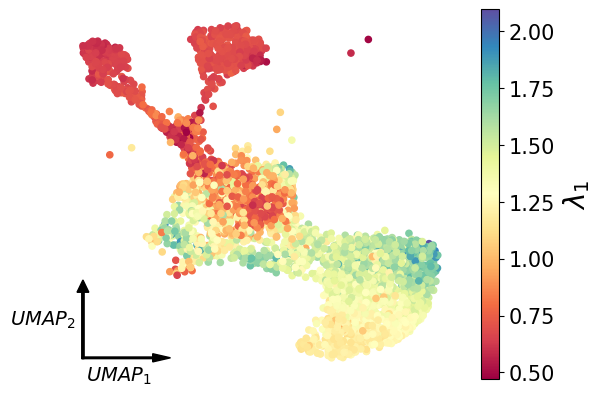

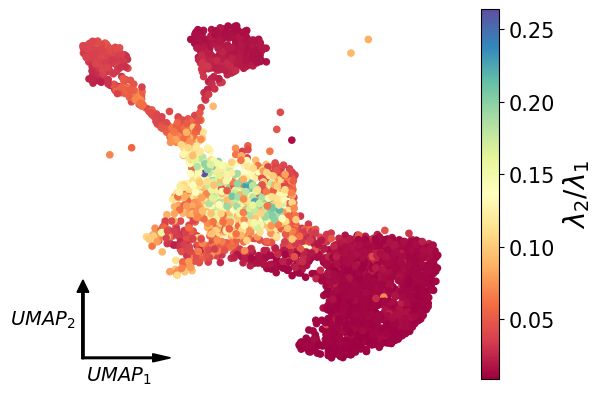

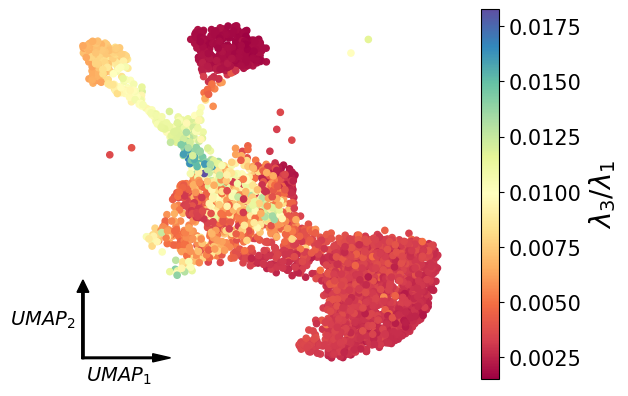

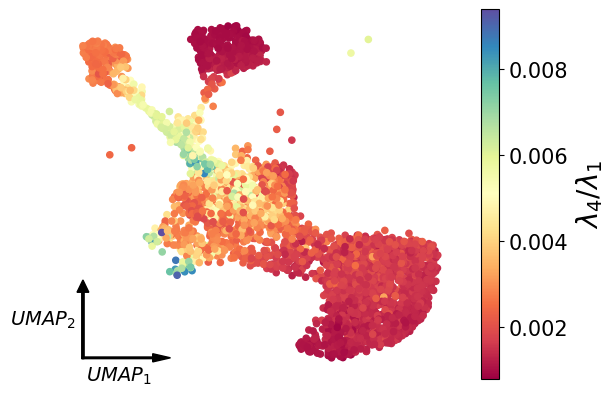

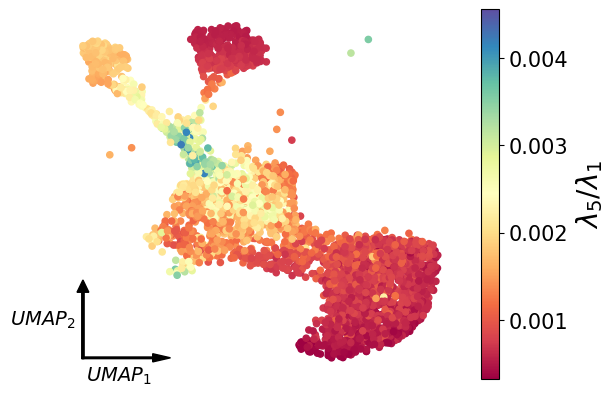

...

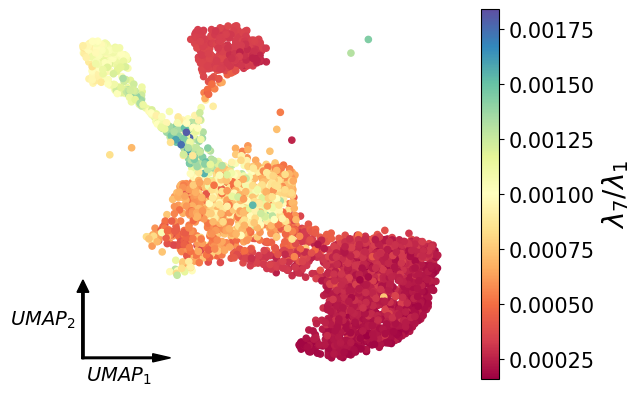

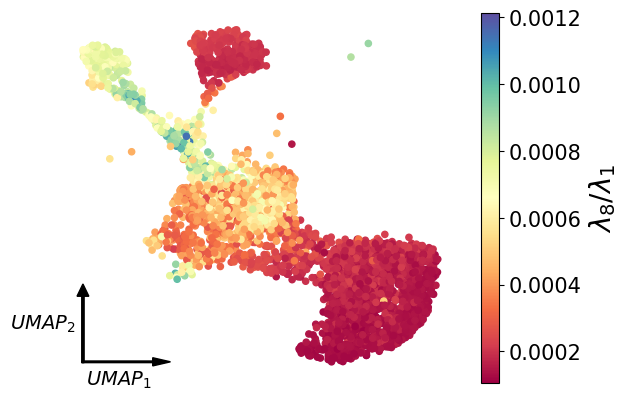

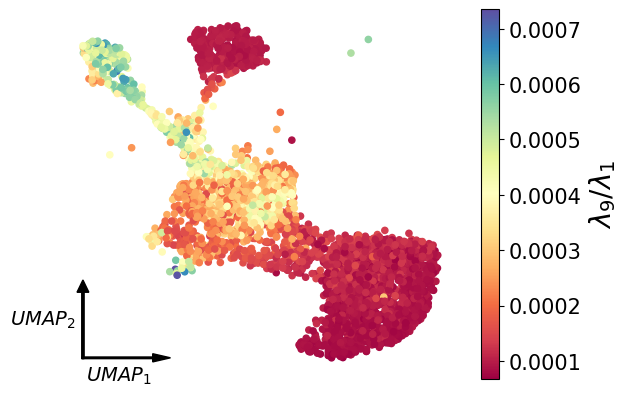

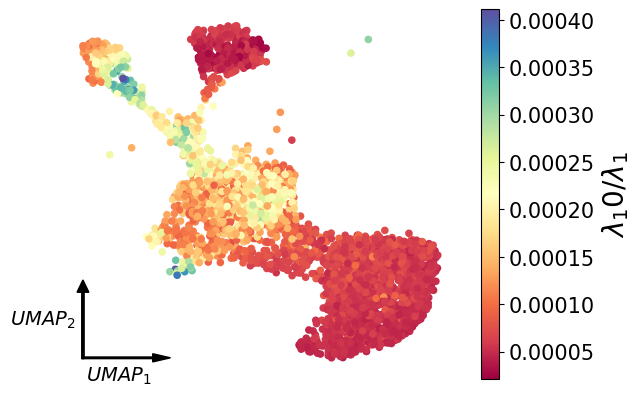

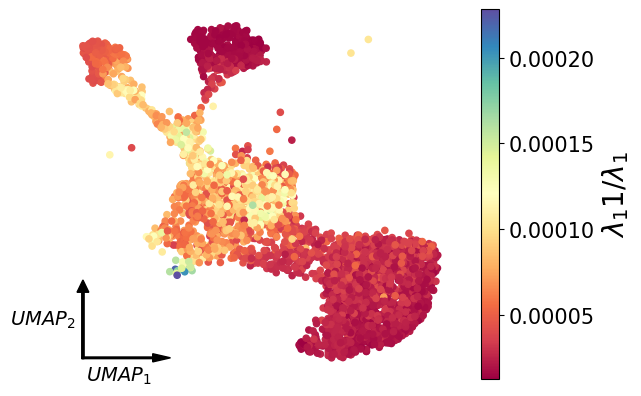

In [59]:
cmap = plt.colormaps['Spectral']
plt.scatter(adata.obsm['X_umap'][:,0], adata.obsm['X_umap'][:,1], c=smooth_func(eigs_hs[:,0]), cmap=cmap, s=20)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel(f'$\lambda_{1}$',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+f'eig_hotspot_{1}')
plt.show()

for k in range(1,hs_dim):
    cmap = plt.colormaps['Spectral']
    plt.scatter(adata.obsm['X_umap'][:,0], adata.obsm['X_umap'][:,1], c=smooth_func(eigs_hs[:,k]/eigs_hs[:,0]), cmap=cmap, s=20)
    plt.axis('off')

    clb=plt.colorbar()
    clb.ax.set_ylabel(f'$\lambda_{k+1}/\lambda_{1}$',fontsize=20,weight='bold')
    clb.ax.tick_params(axis='y', labelsize=15)

    plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
    plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
    plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
    plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

    plt.savefig(result_path+f'eig_ratio_hotspot_{k+1}')
    plt.show()

In [60]:
np.save(result_path+'/fisher_hotspot', Fisher_hs)
np.save(result_path+'/eig_hotspot', eigs_hs)
np.save(result_path+'/eigvec_hotspot', eigvecs_hs)

## **IV** ##

In [61]:
IV_latent = zv1_smooth

In [62]:
model = nn.Sequential(
    nn.Linear(pca_dim, 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,cell_eigen_X.shape[1]),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(encoder.parameters(), lr=learning_rate)

x_in=torch.tensor(X_pca.astype(np.float32))
x_out=torch.tensor(cell_eigen_X.astype(np.float32))
# Train the model
for epoch in range(200):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
#     if epoch% 10 == 9:
#         print(epoch,loss)
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

pEg_pX = np.zeros([X.shape[0], cell_eigen_X.shape[1], X_pca.shape[1]])

# Compute the gradients
for i in range(X.shape[0]):
    x0=torch.tensor(X_pca[i,:],requires_grad=True)
    z=model(x0)
    for j in range(cell_eigen_X.shape[1]):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        pEg_pX[i,j,:] = x0.grad.detach()

Eg_velo = np.array([pEg_pX[i]@velo_pca[i] for i in range(X.shape[0])])

Egv2 = np.zeros(X.shape[0])
for i in range(X.shape[0]):
    Egv2[i] = Eg_velo[i] @ Fisher_eg[i] @ Eg_velo[i].T
Egv1 = np.sqrt(Egv2)
IV_eigen = smooth_func(Egv1)

In [63]:
model = nn.Sequential(
    nn.Linear(pca_dim, 128),
    nn.ReLU(),
    nn.Linear(128,64),
    nn.ReLU(),
    nn.Linear(64,cell_hs_X.shape[1]),
)

# Define your loss function and optimizer
loss_fn = nn.MSELoss()
optimizer = optim.Adam(encoder.parameters(), lr=learning_rate)

x_in=torch.tensor(X_pca.astype(np.float32))
x_out=torch.tensor(cell_hs_X.astype(np.float32))
# Train the model
for epoch in range(200):  # number of epochs
    # Forward pass
    output = model(x_in)
    loss = loss_fn(output,x_out) 
#     if epoch% 10 == 9:
#         print(epoch,loss)
    # Backward pass and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

phs_pX = np.zeros([X.shape[0], cell_hs_X.shape[1], X_pca.shape[1]])

# Compute the gradients
for i in range(X.shape[0]):
    x0=torch.tensor(X_pca[i,:],requires_grad=True)
    z=model(x0)
    for j in range(cell_hs_X.shape[1]):
        x0.grad = None       
        z[j].backward(retain_graph=True)
        phs_pX[i,j,:] = x0.grad.detach()

hs_velo = np.array([phs_pX[i]@velo_pca[i] for i in range(X.shape[0])])

hsv2 = np.zeros(X.shape[0])
for i in range(X.shape[0]):
    hsv2[i] = hs_velo[i] @ Fisher_hs[i] @ hs_velo[i].T
hsv1 = np.sqrt(hsv2)
IV_hotspot = smooth_func(hsv1)

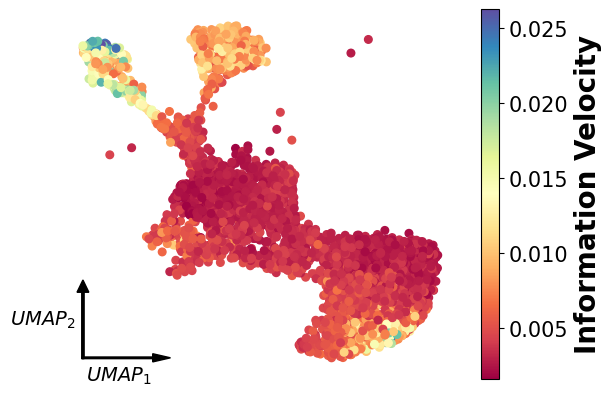

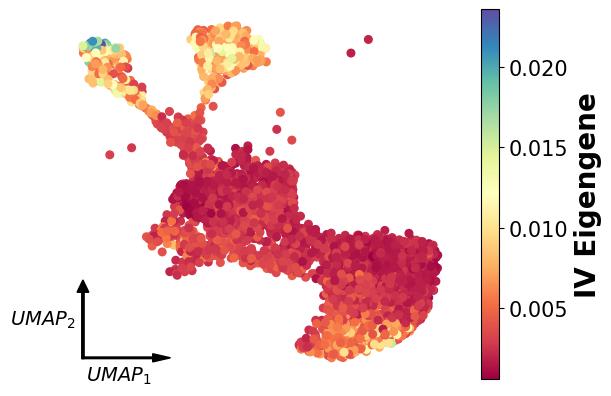

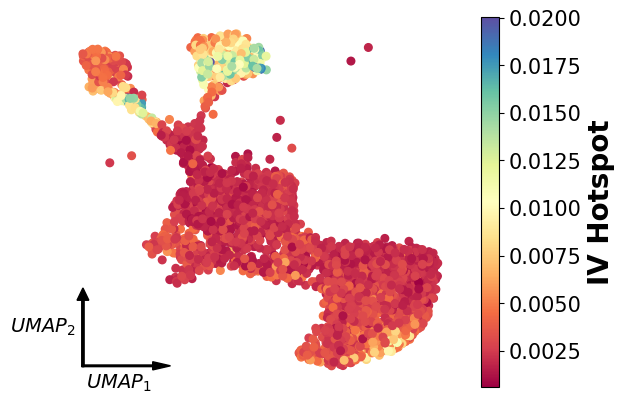

In [66]:
idx = ~np.isnan(zv1_smooth)
cmap = plt.colormaps['Spectral']
plt.scatter(X_plt[idx],Y_plt[idx],c=IV_latent[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('Information Velocity',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'iv')
plt.show()

# IV Eg
plt.scatter(X_plt[idx],Y_plt[idx],c=IV_eigen[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('IV Eigengene',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'iv_eg')
plt.show()

# IV Hotspot
plt.scatter(X_plt[idx],Y_plt[idx],c=IV_hotspot[idx],s=30,cmap=cmap)
plt.axis('off')

clb=plt.colorbar()
clb.ax.set_ylabel('IV Hotspot',fontsize=20,weight='bold')
clb.ax.tick_params(axis='y', labelsize=15)
# plt.savefig(figure_path+'5c1.png',dpi=600,bbox_inches='tight')

plt.arrow(X_ori-wid/2,Y_ori,X_len,0,width=wid,color='black',head_width=5*wid)
plt.arrow(X_ori,Y_ori-wid/2,0,Y_len,width=wid,color='black',head_width=5*wid)
plt.text(X_ori+X_len/2,Y_ori-wid*14,'$UMAP_1$',fontsize=14,ha='center',weight='bold')
plt.text(X_ori-wid*17,Y_ori+Y_len/2,'$UMAP_2$',fontsize=14,ha='center',weight='bold')

plt.savefig(result_path+'iv_hotspot')
plt.show()